# Assignment 3

## imports

In [1]:
import numpy as np 
import cv2
from matplotlib import pyplot as plt
import string
import math
import time
import cmath
import random
loc = "../imgs/"


# Q1.

In [2]:
def piecewiseLinTransform(k1,k2,a,b,image):
    img = image.copy()
   
    for j in range(np.size(k1)):
        where = np.where((img >= a[j]) & (img < b[j]))
        img[where] = np.multiply(img[where],k1[j])
        img[where] = np.add(img[where],k2[j])
    
    return(img)

In [16]:
def erosion(image,mask):
    img = image.copy()
    mask_size = np.shape(mask)
    a = mask
    # where_1 = np.where(a == 255)
    t = int(mask_size[0]/2)
    size = np.shape(img)
    output = np.zeros(size,dtype=np.uint8)

    for i in range(t,size[0]-t ):
        for j in range(t,size[1]-t):
            b = img[i-t:i+t+1,j-t:j+t+1]
            # x = np.unique(b[where_1])
            if(np.array_equal(a,b)):
                output[i,j] = 255
    
    return output

In [24]:
def dilation(image,mask):
    img = image.copy()
    mask_size = np.shape(mask)
    a = mask
    # where_1 = np.where(a == 255)
    t = int(mask_size[0]/2)
    size = np.shape(img)
    output = np.zeros(size,dtype=np.uint8)

    for i in range(t,size[0]-t ):
        for j in range(t,size[1]-t):
            # b = img[i-t:i+t+1,j-t:j+t+1]
            c = output[i-t:i+t+1,j-t:j+t+1]
            if(img[i,j]==255):
                output[i-t:i+t+1,j-t:j+t+1] = a

    
    return output

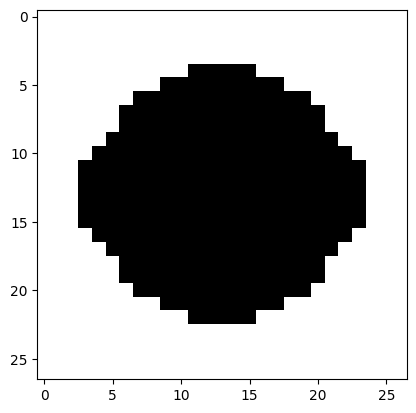

In [5]:
mark = np.array([[255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255],
 [255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255],
 [255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255],
 [255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,  255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255],
 [255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,   0,   0,  0,   0,   0,   255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255],
 [255, 255, 255, 255, 255, 255, 255, 255, 255,   0,   0,   0,   0,  0,   0,   0,   0,   0,   255, 255, 255, 255, 255, 255, 255, 255, 255],
 [255, 255, 255, 255, 255, 255, 255,   0,   0,   0,   0,   0,   0,  0,   0,   0,   0,   0,   0,   0, 255, 255, 255, 255, 255, 255, 255],
 [255, 255, 255, 255, 255, 255,   0,   0,   0,   0,   0,   0,   0,  0,   0,   0,   0,   0,   0,   0,   0, 255, 255, 255, 255, 255, 255],
 [255, 255, 255, 255, 255, 255,   0,   0,   0,   0,   0,   0,   0,  0,   0,   0,   0,   0,   0,   0,   0, 255, 255, 255, 255, 255, 255],
 [255, 255, 255, 255, 255,   0,   0,   0,   0,   0,   0,   0,   0,  0,   0,   0,   0,   0,   0,   0,   0,   0, 255, 255, 255, 255, 255],
 [255, 255, 255, 255,   0,   0,   0,   0,   0,   0,   0,   0,   0,  0,   0,   0,   0,   0,   0,   0,   0,   0,   0, 255, 255, 255, 255],
 [255, 255, 255,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0, 255, 255, 255],
 [255, 255, 255,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0, 255, 255, 255],
 [255, 255, 255,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0, 255, 255, 255],
 [255, 255, 255,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0, 255, 255, 255],
 [255, 255, 255,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0, 255, 255, 255],
 [255, 255, 255, 255,   0,   0,   0,   0,   0,   0,   0,   0,   0,  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,  255, 255, 255, 255],
 [255, 255, 255, 255, 255,   0,   0,   0,   0,   0,   0,   0,   0,  0,   0,   0,   0,   0,   0,   0,   0,   0,  255, 255, 255, 255, 255],
 [255, 255, 255, 255, 255, 255,   0,   0,   0,   0,   0,   0,   0,  0,   0,   0,   0,   0,   0,   0,   0,  255, 255, 255, 255, 255, 255],
 [255, 255, 255, 255, 255, 255,   0,   0,   0,   0,   0,   0,   0,  0,   0,   0,   0,   0,   0,   0,   0,  255, 255, 255, 255, 255, 255],
 [255, 255, 255, 255, 255, 255, 255,   0,   0,   0,   0,   0,   0,  0,   0,   0,   0,   0,   0,   0,  255, 255, 255, 255, 255, 255, 255],
 [255, 255, 255, 255, 255, 255, 255, 255, 255,   0,   0,   0,   0,  0,   0,   0,   0,   0,   255,  255, 255, 255, 255, 255, 255, 255, 255],
 [255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,   0,   0,  0,   0,   0,   255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255],
 [255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,  255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255],
 [255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255],
 [255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255],
 [255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255]],dtype=np.uint8)

plt.imshow(mark,cmap='gray')
 

In [6]:
def hit_miss(spot,kernel):
    if(np.shape(spot) != np.shape(kernel)): return False
    where_0 = np.where(kernel == 0)   
    uniq = np.unique(spot[where_0])
    if(len(uniq) == 2): return False
    if(uniq[0] == 255): return False
    if(uniq[0] == 0): return True
    
    return False

In [7]:
anskey = cv2.imread(loc+'answerKey.jpg',0)
# soln = cv2.imread(loc+'answerKey_mod.jpg',0)
# anskey = anskey[:-1,:-1]
k1 = [0,0]
k2 = [0,255]
a = [0,156]
b = [157,255]
anskey_thres = piecewiseLinTransform(k1,k2,a,b,anskey)
start_v = 799
h_cord = [222,559,896]
sq_s = 27
gap = 15
gap_x = 15.4
answers = [-1]*45
l = 0
for i in range(3):
    g = start_v
    x = start_v
    y = h_cord[i]
    for j in range(15):
        a = y 
        b = a + sq_s + gap
        c = b + sq_s + gap
        d = c + sq_s + gap
        g = (g + gap_x + sq_s)
        if(hit_miss(anskey_thres[x:x+sq_s,a:a+sq_s],mark)): answers[l] = 'A'
        if(hit_miss(anskey_thres[x:x+sq_s,b:b+sq_s],mark)): answers[l] = 'B'
        if(hit_miss(anskey_thres[x:x+sq_s,c:c+sq_s],mark)): answers[l] = 'C'
        if(hit_miss(anskey_thres[x:x+sq_s,d:d+sq_s],mark)): answers[l] = 'D'
        x = int(g)
        l = l+1

for i in range(1,16):
        print("Q."+str(i)+" = "+str(answers[i-1]),"Q."+str(15+i)+" = "+str(answers[14+i]),"Q."+str(30+i)+" = "+str(answers[29+i]))

Q.1 = B Q.16 = A Q.31 = B
Q.2 = C Q.17 = D Q.32 = B
Q.3 = A Q.18 = B Q.33 = D
Q.4 = A Q.19 = C Q.34 = C
Q.5 = D Q.20 = B Q.35 = B
Q.6 = A Q.21 = D Q.36 = C
Q.7 = C Q.22 = C Q.37 = B
Q.8 = C Q.23 = D Q.38 = C
Q.9 = A Q.24 = B Q.39 = C
Q.10 = C Q.25 = D Q.40 = A
Q.11 = A Q.26 = C Q.41 = B
Q.12 = B Q.27 = D Q.42 = B
Q.13 = C Q.28 = D Q.43 = C
Q.14 = C Q.29 = B Q.44 = C
Q.15 = B Q.30 = C Q.45 = B


# Q2. Creed’s Side Gig

In [29]:
def make_ref(min,max,keys):
    i = 1
    flag = -1
    for k in keys:
        if(min in keys[k]):
            for j in keys:
                if(max in keys[j]):
                    if(j != k):
                        for l in keys[j]:
                            keys[k].append(l)
                        keys[j].clear()
                    flag = 0
                    break   
                        
            keys[k].append(max)
            flag = 0
            break
                    
        if(max in keys[k]):
            for j in keys:
                if(min in keys[j]):
                    if(j != k):
                        for l in keys[j]:
                            keys[k].append(l)
                        keys[j].clear()
                    flag = 0
                    break
            keys[k].append(min)
            flag = 0
            break
        i = i+1

    if(flag == -1):
        keys[i] = [min,max]
    
    for k in keys:
        keys[k] = list(set(keys[k]))
    return keys

In [30]:

def ccl(image):
    img = image.copy()
    img = img.astype(np.uint32)
    new_comp = 2
    x,y = np.shape(image)
    keys = {}
    for i in range(x):
        for j in range(y):
            temp = []
            if(img[i,j] !=0):
                if(i-1>=0):
                    if(img[i-1,j]!=0):
                        temp.append(img[i-1,j])
                if(j-1>=0):
                    if(img[i,j-1]!=0):
                        temp.append(img[i,j-1])

                temp = list(set(temp))
                if(len(temp) == 0):
                    img[i,j] = new_comp
                    new_comp = new_comp +1

                if(len(temp) == 1):
                    img[i,j] = temp[0]
                
                if(len(temp)==2):                   
                    img[i,j] = min(temp)
                    keys = make_ref(min(temp),max(temp),keys)
                # print(i,j,temp,keys)
                temp.clear()
    
    output = img.copy()
    for t in keys:
        for i in keys[t]:
            where = np.where(img == i)  
            output[where] = t

    return output

In [31]:
def color_map(image):
    img = image.copy()
    shape = np.shape(img)
    output = np.zeros((shape[0],shape[1],3),dtype=np.uint8)
    unique = np.unique(img)
    # i = 0
    for j in unique:
        if(j ==0):
            where = np.where(img == j)
            output[where[0],where[1],0] = 0
            output[where[0],where[1],1] = 0
            output[where[0],where[1],2] = 0
        else:
            where = np.where(img == j)
            output[where[0],where[1],0] = random.randrange(0,255)
            output[where[0],where[1],1] = random.randrange(0,255)
            output[where[0],where[1],2] = random.randrange(0,255)
    
    return output

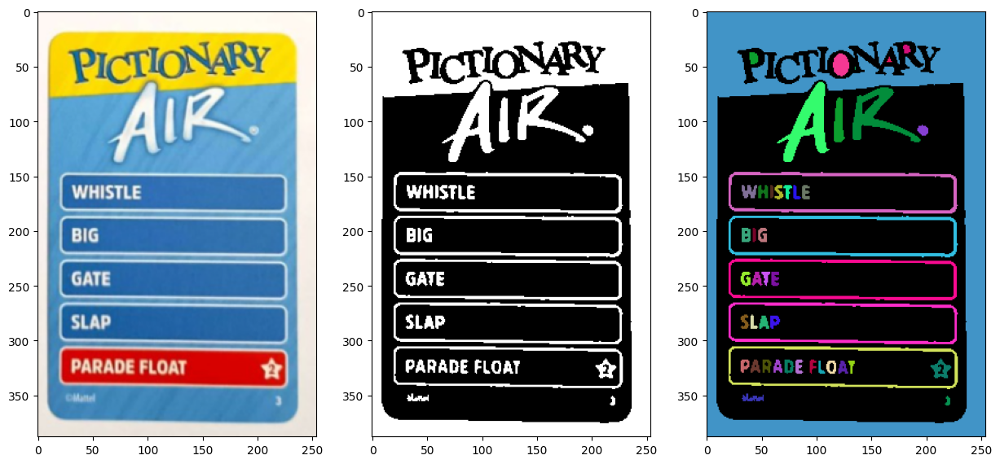

In [32]:
pict = cv2.imread(loc+'pictionary.png')
pict = cv2.cvtColor(pict,cv2.COLOR_BGR2RGB)

pict_g = cv2.cvtColor(pict,cv2.COLOR_RGB2GRAY)
k1 = [0,0]
k2 = [0,1]
a = [0,161]
b = [162,255]
pict_g = piecewiseLinTransform(k1,k2,a,b,pict_g)
out_c = ccl(pict_g)
out = color_map(out_c)
plt.figure(figsize=(15,10))
plt.subplot(131)
plt.imshow(pict)
plt.subplot(132)
plt.imshow(pict_g,cmap='gray')
plt.subplot(133)
plt.imshow(out)


# Q3. Color Operations

## a.


In [33]:
def med_filter(image,k):
    x,y,z = np.shape(image)
    output = np.zeros(np.shape(image),dtype= np.uint8)
    salt = np.zeros((x+k-1,y+k-1,z),dtype= np.uint8)
    t = int(k/2)
    
    salt[:,:,0] = np.pad(image[:,:,0],t)
    salt[:,:,1] = np.pad(image[:,:,1],t)
    salt[:,:,2] = np.pad(image[:,:,2],t)


    for i in range(x):
            for j in range(y):
                temp = np.reshape(salt[i:i+k,j:j+k,:],(k*k,3))
                output[i,j,:] = np.median(temp,axis=0)
                temp = np.reshape(temp,(k,k,3))
    
    return output

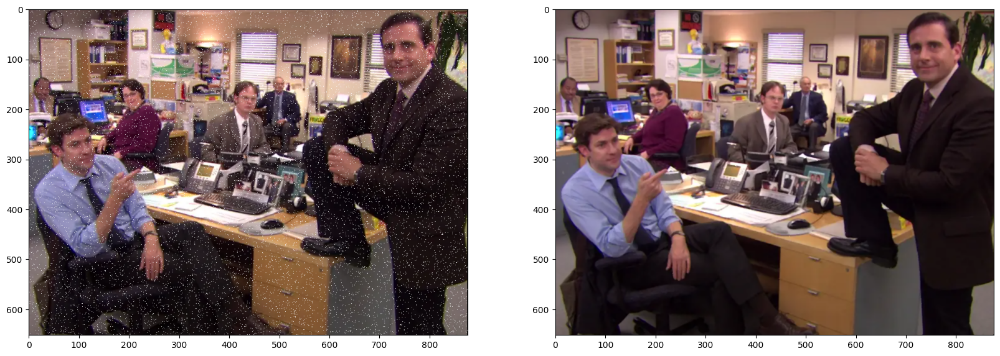

In [34]:
salt = cv2.imread(loc+'salt.png')
salt= cv2.cvtColor(salt,cv2.COLOR_BGR2RGB)
output = med_filter(salt,3)

plt.figure(figsize=(20,15))
plt.subplot(121)
plt.imshow(salt)
plt.subplot(122)
plt.imshow(output)

## b.

In [35]:
def powerLawTransform(image, gamma):
    if gamma < 0:
        return 0
    img = image.copy()
    if gamma > 1:
        c = 255
        img = np.divide(img,255)
    if gamma <=1:
        c = pow(255,1-gamma)
    
    output = np.power(img,gamma)
    output = np.multiply(c,output)
    return output

def powerLaw_RGB(image,gamma):
    output = np.zeros(np.shape(image),dtype=np.uint8)
    img = image.copy()
    for i in range(3):
        output[:,:,i] = powerLawTransform(img[:,:,i],gamma[i])
    return output

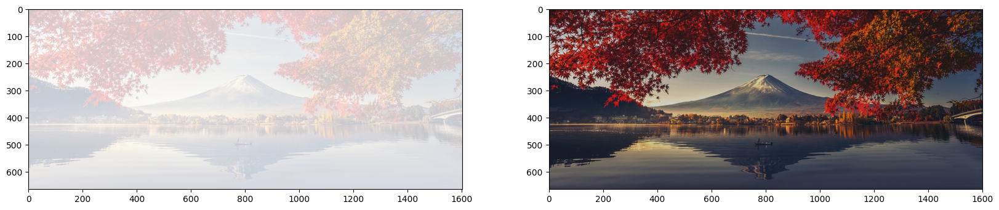

In [36]:
land = cv2.imread(loc+'landscape.png')
land = cv2.cvtColor(land,cv2.COLOR_BGR2RGB)

gam_r = 10
gam_g = 5
gam_b = 10
gamma = [gam_r,gam_b,gam_r]
output = powerLaw_RGB(land,gamma)

plt.figure(figsize=(20,20))
plt.subplot(121)
plt.imshow(land)
plt.subplot(122)
plt.imshow(output)
plt.show()

## c.

In [37]:
def hist_eql(image):
    img = image.copy()
    [x,y] = np.shape(img)
    output = np.zeros((x,y))
    unique,counts = np.unique(image,return_counts=True)     # Here we count the number of pixels for eah of the intensity 
    for i in range(256):
        where = np.where(unique <= i )                      # Then using the pdfs of the intensity we map each intensity 
        sum = np.sum(counts[where])/(x*y)                   # to the equalized intensity and replae the origional intensity 
        intent = round(255*sum)                             # with the modified intensity
        output[np.where(img == i)] = intent
    return output


def hist_eql_rgb(image):
    img = image.copy()
    [x,y,z] = np.shape(img)
    output = np.zeros((x,y,z),dtype=np.uint8)
    for i in range(3):
        output[:,:,i] = hist_eql(img[:,:,i])
    return output


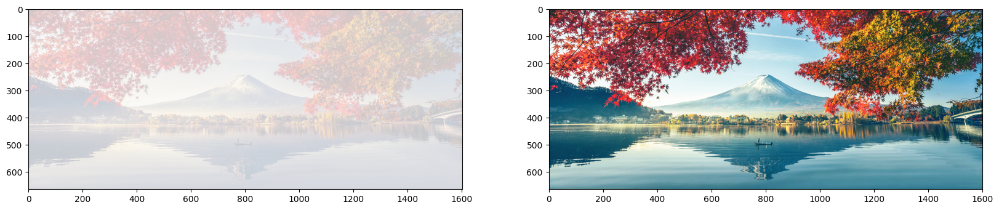

In [38]:
land = cv2.imread(loc+'landscape.png')
land = cv2.cvtColor(land,cv2.COLOR_BGR2RGB)

output = hist_eql_rgb(land)

plt.figure(figsize=(20,20))
plt.subplot(121)
plt.imshow(land)
plt.subplot(122)
plt.imshow(output)
plt.show()

## d.

In [39]:
def multiply_kernel(kernel,image):
    if(np.shape(kernel) != np.shape(image)): return image
    a,b = np.shape(kernel)
    kernel = kernel.reshape(a*b)
    image = image.reshape(a*b)

    output = np.dot(kernel,image)
    
    kernel = kernel.reshape(a,b)
    image = image.reshape(a,b)
    return output

In [40]:
def vintage(image):
    img = image.copy()
    r = img[:,:,0]
    g = img[:,:,1]
    b = img[:,:,2]
    output = img.copy()
    output = output.astype(np.uint16)
    output[:,:,0] = (r*0.293 + g*0.769 + b*0.210).astype(np.uint16)
    output[:,:,1] = (r*0.249 + g*0.686 + b*0.188).astype(np.uint16)
    output[:,:,2] = (r*0.172 + g*0.534 + b*0.151).astype(np.uint16)

    return output


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


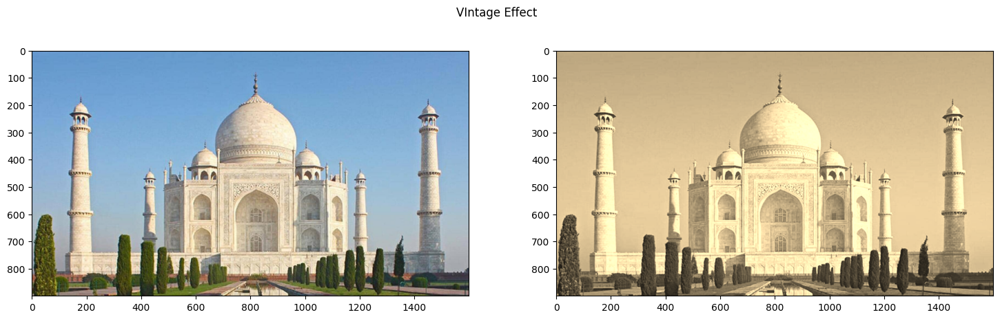

In [41]:
image = cv2.imread("../imgs/taj.jpg")
image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)

output = vintage(image)

plt.figure(figsize=(18,5))
plt.suptitle("VIntage Effect")
plt.subplot(121)
plt.imshow(image)
plt.subplot(122)
plt.imshow(output)
plt.show()

In [42]:
elem = np.array([[[0,0,0,0,0,0,0,0,0,0,0],
                 [0,0,0,0,1,1,1,0,0,0,0],
                 [0,0,0,1,1,1,1,0,0,0,0],
                 [0,0,1,1,1,1,1,0,0,0,0],
                 [0,0,0,0,1,1,1,0,0,0,0],
                 [0,0,0,0,1,1,1,0,0,0,0],
                 [0,0,0,0,1,1,1,0,0,0,0],
                 [0,0,0,0,1,1,1,0,0,0,0],
                 [0,0,0,0,1,1,1,0,0,0,0],
                 [0,0,1,1,1,1,1,1,1,0,0],
                 [0,0,0,0,0,0,0,0,0,0,0]],
                 [[0,0,0,0,0,0,0,0,0,0,0],
                 [0,0,0,1,1,1,1,1,0,0,0],
                 [0,0,1,1,0,0,0,1,1,0,0],
                 [0,0,1,1,0,0,0,1,1,0,0],
                 [0,0,1,1,0,0,0,1,1,0,0],
                 [0,0,1,1,0,1,0,1,1,0,0],
                 [0,0,1,1,0,0,0,1,1,0,0],
                 [0,0,1,1,0,0,0,1,1,0,0],
                 [0,0,1,1,0,0,0,1,1,0,0],
                 [0,0,0,1,1,1,1,1,0,0,0],
                 [0,0,0,0,0,0,0,0,0,0,0]]],dtype=np.uint8)
        


In [43]:
import random
def matrixs(image):
    img = image.copy()
    shape = np.shape(elem)
    size = np.shape(img)
    gam_r = 30
    gam_g = 8
    gam_b = 3
    gamma = [gam_r,gam_b,gam_r]
    img = powerLaw_RGB(img,gamma)
    output = img.copy()
    for i in range(0,size[0] - (size[0])%shape[1],shape[1]):
        for j in range(0,size[1] - (size[1])%shape[1],shape[1]):
            x  = random.randint(0,1)
            output[i:i+shape[1],j:j+shape[1],0] = (img[i:i+shape[1],j:j+shape[1],0]*elem[x])
            output[i:i+shape[1],j:j+shape[1],1] = (img[i:i+shape[1],j:j+shape[1],1]*elem[x])
            output[i:i+shape[1],j:j+shape[1],2] = (img[i:i+shape[1],j:j+shape[1],2]*elem[x])
    
    return output      

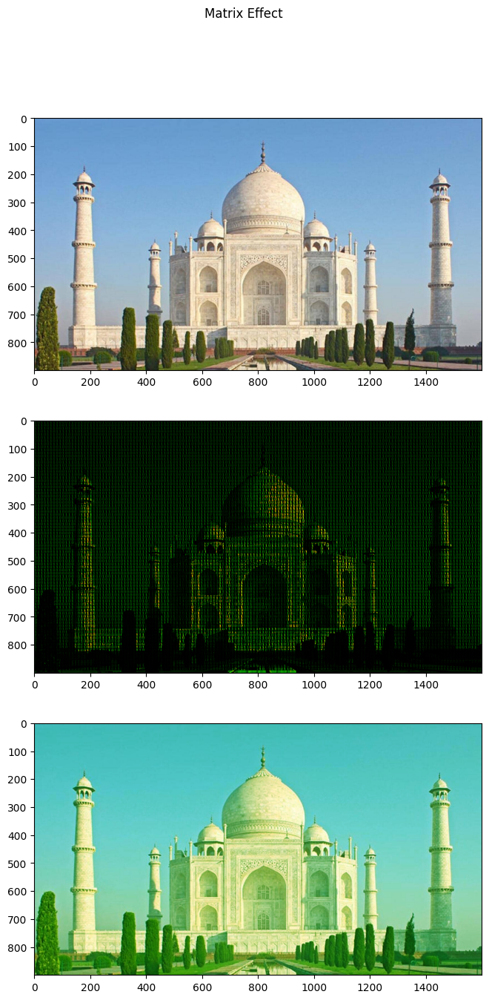

In [44]:
image = cv2.imread("../imgs/taj.jpg")
image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)

output = matrixs(image)
output2 = powerLaw_RGB(image,(1.5,0.6,1.5))
plt.figure(figsize=(15,15))
plt.suptitle("Matrix Effect")
plt.subplot(311)
plt.imshow(image)
plt.subplot(312)
plt.imshow(output)
plt.subplot(313)
plt.imshow(output2)
plt.show()

In [45]:
def gaussKernelGenerator(k , var):
    kernel = np.zeros((k,k))
    kl = math.floor(k/2)
    for i in range(k):
        for j in range(k):
            kernel[i,j] = math.exp(-(pow((i-kl),2) + pow((j-kl),2))/(2*pow(var,2)))
    const = np.sum(kernel)
    kernel = np.divide(kernel,const)
    return kernel


In [46]:
def vignett(image):
    img = image.copy()
    size = np.shape(img)
    kernel = gaussKernelGenerator(max(size),max(size)/4)
    kernel = 2*kernel*255/np.linalg.norm(kernel)   
    k = max(size)
    kernel = kernel[int((k-size[0])/2):int((k+size[0])/2),int((k-size[1])/2):int((k+size[1]/2))]
    output = img.copy()
    output[:,:,0] = img[:,:,0]*kernel
    output[:,:,1] = img[:,:,1]*kernel
    output[:,:,2] = img[:,:,2]*kernel
    
    return output


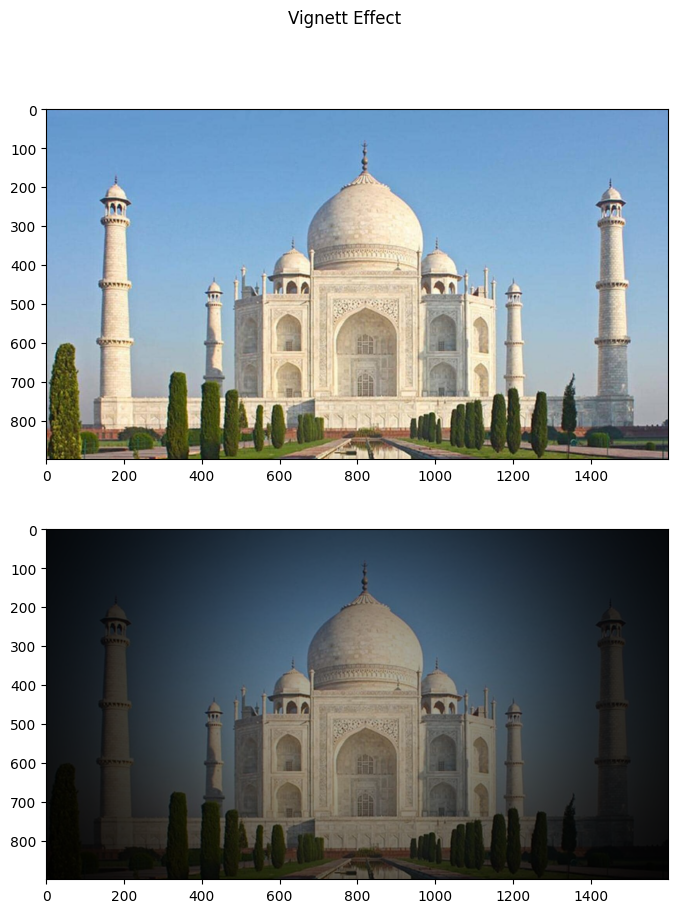

In [47]:
image = cv2.imread("../imgs/taj.jpg")
image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)

output = vignett(image)
# output = gaussKernelGenerator(1600,1000)*255*1000 
plt.figure(figsize=(10,10))
plt.suptitle("Vignett Effect")
plt.subplot(211)
plt.imshow(image)
plt.subplot(212)
plt.imshow(output)
plt.show()

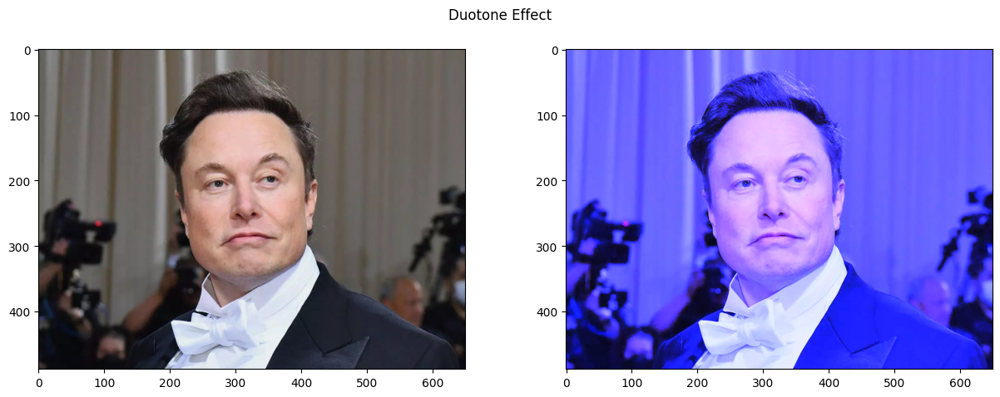

In [48]:
def duotone(image,r=None,g=None,b=None):
    img = image.copy()
    rl = np.zeros(256).astype(np.uint8)
    gl = np.zeros(256).astype(np.uint8)
    bl = np.zeros(256).astype(np.uint8)
    for i in range(1,256):
        if(r):
            rl[i] = (min(pow(i,r),255))
        if(g):
            gl[i] = (min(pow(i,g),255))
        if(b):
            bl[i] = (min(pow(i,b),255))
    
    if(r):
        img[:,:,0] = cv2.LUT(img[:,:,0],rl)
    if(g):
        img[:,:,1] = cv2.LUT(img[:,:,1],gl)
    if(b):
        img[:,:,2] = cv2.LUT(img[:,:,2],bl)
    return img

image = cv2.imread("../imgs/elon-musk.jpg")
image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
output = duotone(image,None,None,1.5)

plt.figure(figsize=(15,5))
plt.suptitle("Duotone Effect")
plt.subplot(121)
plt.imshow(image)
plt.subplot(122)
plt.imshow(output)
plt.show()

# Q4. Realistic Systems

## 4.1 Image Rotation

In [49]:
def dims(len_x,len_y,angles):
    if(angles > math.pi/2):
        angle = angles - math.pi/2
    else:
        angle = angles
    a = int(len_x/2)
    b = int(len_y/2)
    
    xa = int(-a*math.cos(angle) + b*math.sin(angle)) 
    ya = int(-a*math.sin(angle) - b*math.cos(angle))

    xb = int(-a*math.cos(angle) - b*math.sin(angle)) 
    yb = int(-a*math.sin(angle) + b*math.cos(angle))

    xc = int(a*math.cos(angle) - b*math.sin(angle)) 
    yc = int(a*math.sin(angle) + b*math.cos(angle))

    xd = int(a*math.cos(angle) + b*math.sin(angle)) 
    yd = int(a*math.sin(angle) - b*math.cos(angle))
    
    
    # print(a,b)
    # print(xa,ya)
    # print(xb,yb)
    # print(xc,yc)
    # print(xd,yd)
    if(angles > math.pi/2): return (abs(yc-ya),abs(xd-xb))
    return (abs(xd-xb),abs(yc-ya))

In [50]:
def interpolation(x,y,img):
    size = np.shape(img)
    sum = 0
    flag = 0
    ceil_x = int(np.ceil(x) + size[0]/2)
    floor_x = int(np.floor(x) + size[0]/2)
    ceil_y = int(np.ceil(y) + size[1]/2)
    floor_y = int(np.floor(y) + size[1]/2)
    i = 0
    if(ceil_x < size[0] and ceil_y < size[1] and ceil_x  >= 0 and ceil_y >= 0 ):
        sum = sum + img[ceil_x,ceil_y]
        flag = 1
        i = i+1
    if(ceil_x < size[0] and floor_y < size[1] and ceil_x  >= 0 and floor_y >= 0 ):
        sum = sum + img[ceil_x,floor_y]
        flag = 1
        i = i+1
    if(floor_x < size[0] and ceil_y < size[1] and floor_x  >= 0 and ceil_y >= 0 ):
        sum = sum + img[floor_x,ceil_y]
        flag = 1
        i = i+1
    if(floor_x < size[0] and floor_y < size[1] and floor_x  >= 0 and floor_y >= 0 ):
        sum = sum + img[floor_x,floor_y]
        flag = 1
        i = i+1
    if(flag == 0):
        return(255)
    else:
        return(int(sum)/i)

In [51]:
def imrotate_g(image,angle,retainAllPixels):
    angle = np.deg2rad(angle)
    img = image.copy()
    size = np.shape(img)
    if(retainAllPixels):
        size_up = dims(size[0],size[1],abs(angle))
        output = np.zeros((size_up[0]+2,size_up[1]+2),dtype=np.uint8)
        for i in range(size_up[0]+2):
            for j in range(size_up[1]+2):
                a = (i-int(size_up[0]/2))
                b = (j-int(size_up[1]/2))
                x = a*math.cos(-angle) - b*math.sin(-angle)
                y = a*math.sin(-angle) + b*math.cos(-angle) 
                output[i,j]  = interpolation(x,y,img)
        
    else:
        output = np.zeros(size,dtype=np.uint8)
        for i in range(size[0]):
            for j in range(size[1]):
                a = (i-int(size[0]/2))
                b = (j-int(size[1]/2))
                x = (a*math.cos(-angle) - b*math.sin(-angle)) 
                y = (a*math.sin(-angle) + b*math.cos(-angle))
                output[i,j]  = interpolation(x,y,img)
    
    return output


In [52]:
def imrotate(image,angle,retainAllPixels):
    output_r = imrotate_g(image[:,:,0],angle,retainAllPixels)
    output_g = imrotate_g(image[:,:,1],angle,retainAllPixels)
    output_b = imrotate_g(image[:,:,2],angle,retainAllPixels)
    output = np.zeros((np.shape(output_r)[0],np.shape(output_r)[1],3),dtype=np.uint8)
    output[:,:,0] = output_r
    output[:,:,1] = output_g
    output[:,:,2] = output_b

    return output

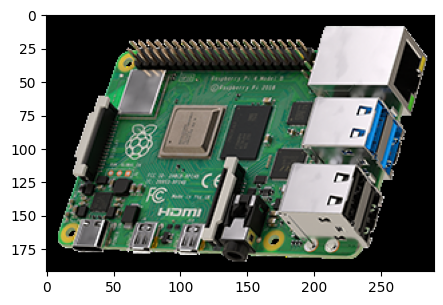

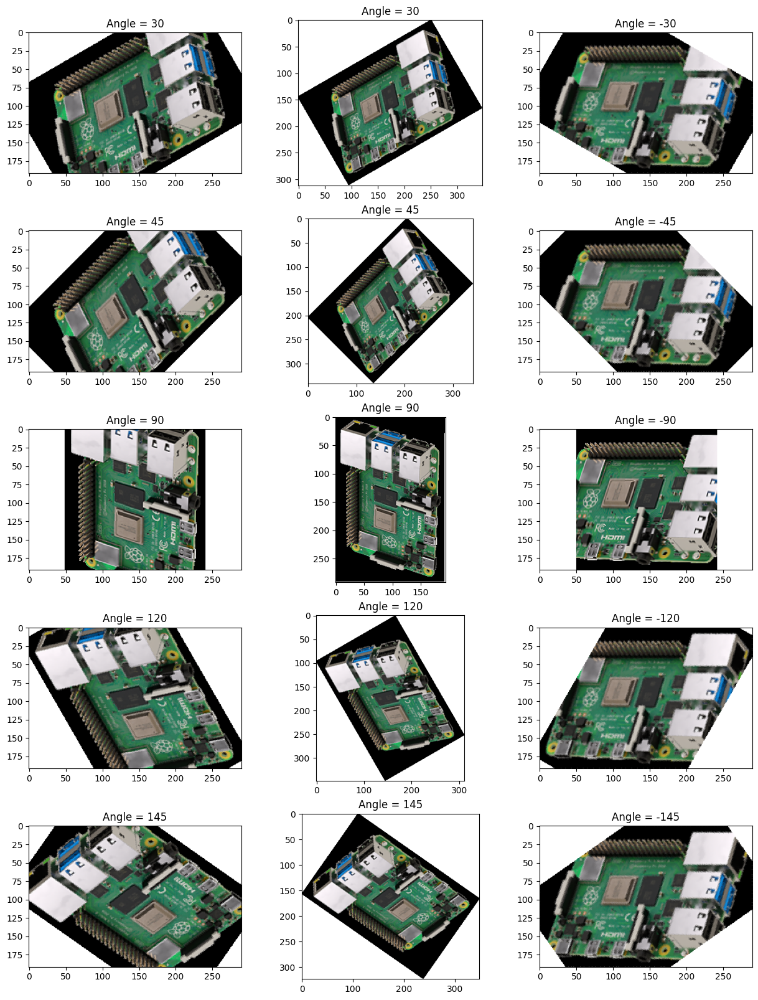

In [92]:
image  = cv2.imread("../imgs/pi2.png")
image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)

angle = [30,45,90,120,145]
# angle = [30]


plt.figure(figsize=(5,5))
plt.imshow(image)
plt.figure(figsize=(15,20))
for i in range(len(angle)):
    output = imrotate(image,angle[i],False)
    output2 = imrotate(image,angle[i],True)
    output3 = imrotate(output,-angle[i],False)
    plt.subplot(5,3,3*i+1)
    plt.imshow(output)
    plt.title("Angle = "+str(angle[i]))
    plt.subplot(5,3,3*i+2)
    plt.imshow(output2)
    plt.title("Angle = "+str(angle[i]))
    plt.subplot(5,3,3*i+3)
    plt.imshow(output3)
    plt.title("Angle = -"+str(angle[i]))
    
    
plt.show()

## 4.2 Hough Transform

### a

To find the angle of rotation we will find the angle of the boundary edges with the coordinate axis and rotate the image with the difference.
We can't use simple edge detection to find the angle of rotation, because in edge detection we only get the gradiant/ of the angle of line thourh with the point passes and not the distance of the line from the origin. But in Hough Transform we have the data of the distances as well as how many points pass through a particular point, using this we can find the angle of rotation   

### b

In [54]:
def edge_detection(image,thres):
    kernelx = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])
    kernely = np.array([[1,2,1],[0,0,0],[-1,-2,-1]])
    img = image.copy()
    [x,y] = np.shape(img)
    G_x = np.zeros(np.shape(img))
    G_y = np.zeros(np.shape(img))
    output = np.zeros(np.shape(img))
    k,k1 = np.shape(kernelx)
    
    img = np.pad(img,math.floor(k/2))
    
    for (i,j),val in np.ndenumerate(G_x):
        G_x[i,j] = multiply_kernel(kernelx,img[i:i+k,j:j+k]) 
        G_y[i,j] = multiply_kernel(kernely,img[i:i+k,j:j+k])
        output[i,j] = math.sqrt(G_x[i,j]**2 + G_y[i,j]**2)
    
    G_x = (np.round(G_x)).astype(int)
    G_y = (np.round(G_y)).astype(int)
    output = (np.round(output)).astype(int)
    where1 = np.where(output >= thres)
    where0 = np.where(output<thres)
    output[where1] = 255
    output[where0] = 0

    return G_x,G_y,output
    

In [55]:
def get_coords(angle,dist,shape):
    coords = []
    
    # j = 0
    if((dist/math.sin(angle)) >=0 and (dist/math.sin(angle))<shape[0]):
        coords.append((int(0),int(dist/math.sin(angle))))
    
    # i = 0
    if((dist/math.cos(angle)) >=0 and (dist/math.cos(angle)<shape[1])):
        coords.append((int(dist/math.cos(angle)),int(0)))
    
    # i = shape[0]
    if(((dist-shape[0]*math.sin(angle))/math.cos(angle)) >=0 and ((dist-shape[0]*math.sin(angle))/math.cos(angle)<shape[1])):
        coords.append((int((dist-shape[0]*math.sin(angle))/math.cos(angle)),int(shape[0])))
    
    # j = shape[1]
    if(((dist-shape[1]*math.cos(angle))/math.sin(angle)) >=0 and ((dist-shape[1]*math.cos(angle))/math.sin(angle)<shape[0])):
        coords.append((int(shape[1]),int((dist-shape[1]*math.cos(angle))/math.sin(angle))))
    
    return list(set(coords))


In [56]:
def hough(image,thres,thres2):
    img = image.copy()
    out = image.copy()
    img = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    size = np.shape(img)

    G_x, G_y,edge = edge_detection(img,thres2)
    angle = np.arctan2(G_y,G_x)
    length = int(np.ceil(math.sqrt(size[0]**2 + size[1]**2)))
    
    dist = np.linspace(-length,length,2*length+1)
    len_dist = len(dist)
    ang = np.linspace(0,180,181)
    sin = np.sin(np.deg2rad(ang))
    cos = np.cos(np.deg2rad(ang))
    len_ang = len(ang)
    param = np.zeros((len_dist,len_ang))
    param_sapce = np.zeros(size)
    
    for (i,j),val in np.ndenumerate(edge):
        for k in range(len_ang):
            if(val ==255):
                p = int((j*cos[k] + i*sin[k]))
                param_sapce[i,j] = p
                x = np.where(dist == p)
                param[x,k] = param[x,k] + 1
    
    coordinates = []
    for i in range(len_dist):
        for j in range(len_ang):
            if(param[i,j] >= thres):
                if(dist[i] == 0): continue
                # print(ang[j],dist[i])
                coordinates.append((ang[j],dist[i]))
                coords = get_coords(np.deg2rad(ang[j]),dist[i],size)
                # print(coords)
                if(len(coords)>=2):
                    out = cv2.line(out,coords[1],coords[0],(0,255,0),1)

    
    return out,edge,param,coordinates


/tmp/ipykernel_732/1646100604.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  if((dist/math.sin(angle)) >=0 and (dist/math.sin(angle))<shape[0]):
/tmp/ipykernel_732/1646100604.py:17: RuntimeWarning: divide by zero encountered in double_scalars
  if(((dist-shape[1]*math.cos(angle))/math.sin(angle)) >=0 and ((dist-shape[1]*math.cos(angle))/math.sin(angle)<shape[0])):


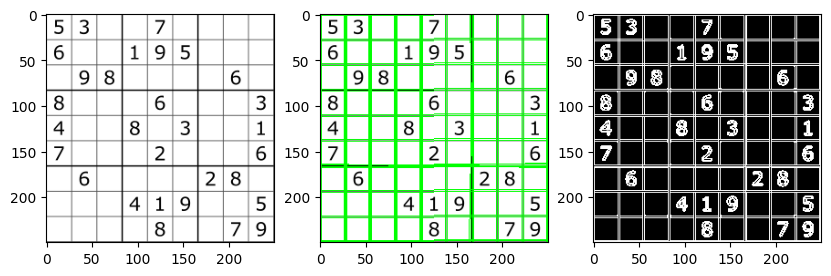

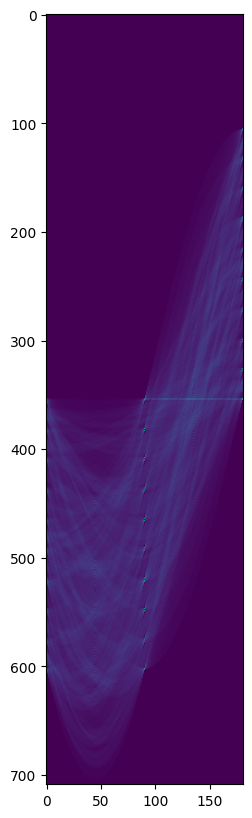

In [57]:
image = cv2.imread("../imgs/suduko.png")
image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
image_bw = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
thres = 160
thres2 = 300
output,edge,param,coordinates = hough(image,thres,thres2)
plt.figure(figsize=(10,10))
plt.subplot(131)
plt.imshow(image)
plt.subplot(132)
plt.imshow(output)
plt.subplot(133)
plt.imshow(edge,cmap='gray')
plt.figure(figsize=(10,10))
plt.imshow(param)
plt.show()


/tmp/ipykernel_732/1646100604.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  if((dist/math.sin(angle)) >=0 and (dist/math.sin(angle))<shape[0]):
/tmp/ipykernel_732/1646100604.py:17: RuntimeWarning: divide by zero encountered in double_scalars
  if(((dist-shape[1]*math.cos(angle))/math.sin(angle)) >=0 and ((dist-shape[1]*math.cos(angle))/math.sin(angle)<shape[0])):


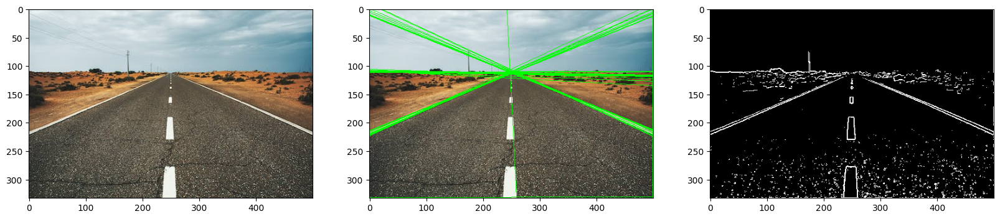

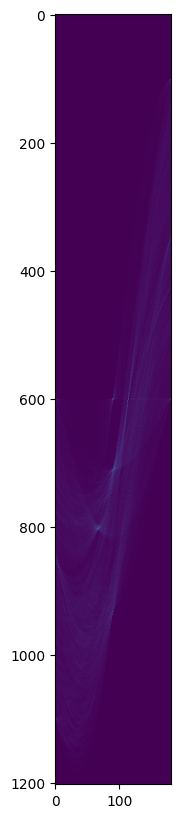

In [58]:
image = cv2.imread("../imgs/road.jpeg")
image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
thres = 120
thres2 = 300
output,edge,param,coordinates = hough(image,thres,thres2)
plt.figure(figsize=(20,10))
plt.subplot(131)
plt.imshow(image)
plt.subplot(132)
plt.imshow(output)
plt.subplot(133)
plt.imshow(edge,cmap='gray')
plt.figure(figsize=(10,10))
plt.imshow(param)
plt.show()


### c

/tmp/ipykernel_732/1646100604.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  if((dist/math.sin(angle)) >=0 and (dist/math.sin(angle))<shape[0]):
/tmp/ipykernel_732/1646100604.py:17: RuntimeWarning: divide by zero encountered in double_scalars
  if(((dist-shape[1]*math.cos(angle))/math.sin(angle)) >=0 and ((dist-shape[1]*math.cos(angle))/math.sin(angle)<shape[0])):


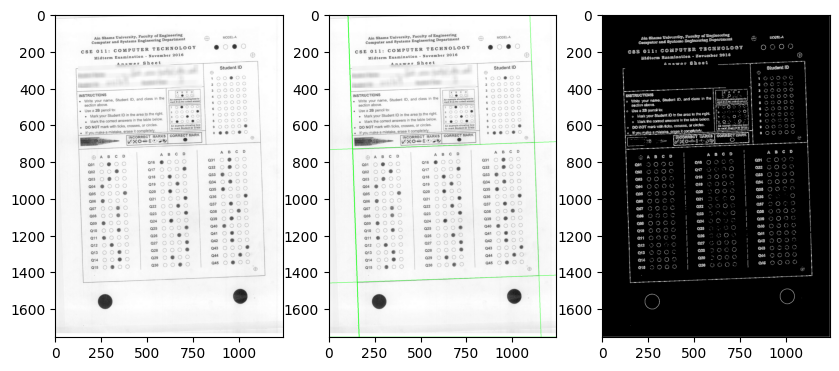

In [59]:
image = cv2.imread("../imgs/rotatedOMR1.png")
image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
image_bw = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
thres = 500
thres2 = 300
output,edge,param,coordinates = hough(image,thres,thres2)
plt.figure(figsize=(10,10))
plt.subplot(131)
plt.imshow(image)
plt.subplot(132)
plt.imshow(output)
plt.subplot(133)
plt.imshow(edge,cmap='gray')
# plt.figure(figsize=(10,10))
# plt.imshow(param)
plt.show()


In [60]:
print(np.shape(image))
print(coordinates)

(1753, 1240, 3)
[(180.0, -1239.0), (180.0, -1238.0), (178.0, -1093.0), (178.0, -1091.0), (178.0, -104.0), (178.0, -103.0), (178.0, -102.0), (178.0, -101.0), (88.0, 735.0), (88.0, 736.0), (0.0, 1239.0), (88.0, 1459.0), (88.0, 1460.0), (90.0, 1752.0)]


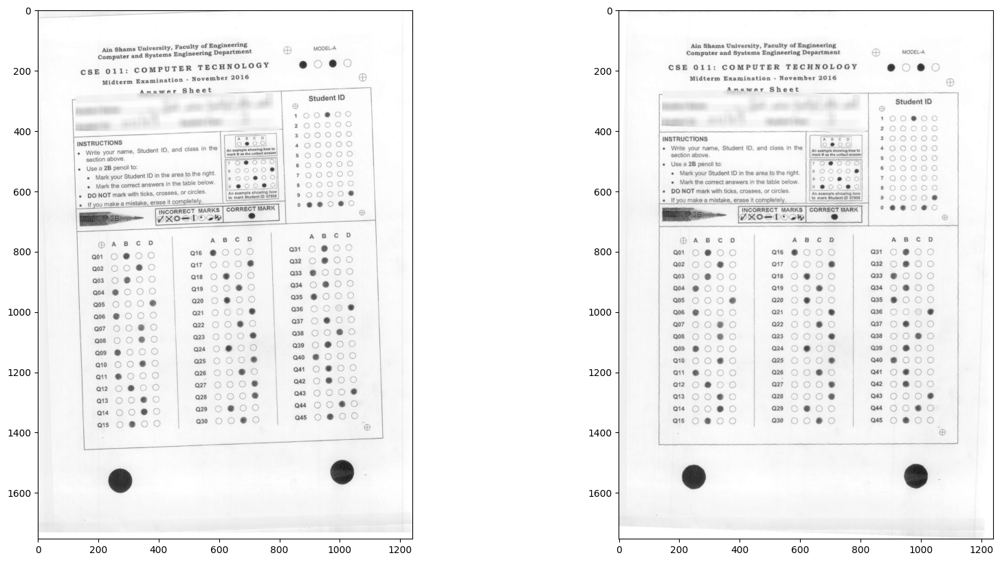

In [61]:
output = imrotate(image,-2,False)

plt.figure(figsize=(20,10))
plt.subplot(121)
plt.imshow(image)
plt.subplot(122)
plt.imshow(output)

/tmp/ipykernel_732/1646100604.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  if((dist/math.sin(angle)) >=0 and (dist/math.sin(angle))<shape[0]):
/tmp/ipykernel_732/1646100604.py:17: RuntimeWarning: divide by zero encountered in double_scalars
  if(((dist-shape[1]*math.cos(angle))/math.sin(angle)) >=0 and ((dist-shape[1]*math.cos(angle))/math.sin(angle)<shape[0])):


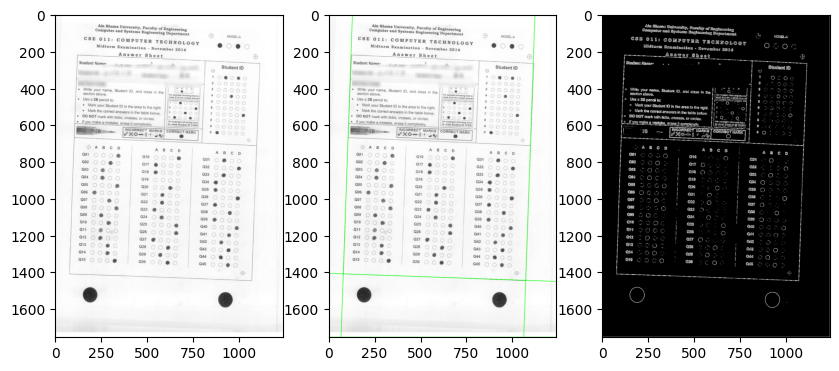

In [62]:
image = cv2.imread("../imgs/rotatedOMR2.png")
image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
image_bw = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
thres = 480
thres2 = 300
output,edge,param,coordinates = hough(image,thres,thres2)
plt.figure(figsize=(10,10))
plt.subplot(131)
plt.imshow(image)
plt.subplot(132)
plt.imshow(output)
plt.subplot(133)
plt.imshow(edge,cmap='gray')
# plt.figure(figsize=(10,10))
# plt.imshow(param)
plt.show()


In [63]:
print(coordinates)

[(180.0, -1239.0), (180.0, -1238.0), (2.0, 126.0), (2.0, 127.0), (2.0, 128.0), (2.0, 1118.0), (2.0, 1120.0), (2.0, 1121.0), (0.0, 1239.0), (92.0, 1406.0), (92.0, 1407.0), (92.0, 1408.0), (90.0, 1752.0)]


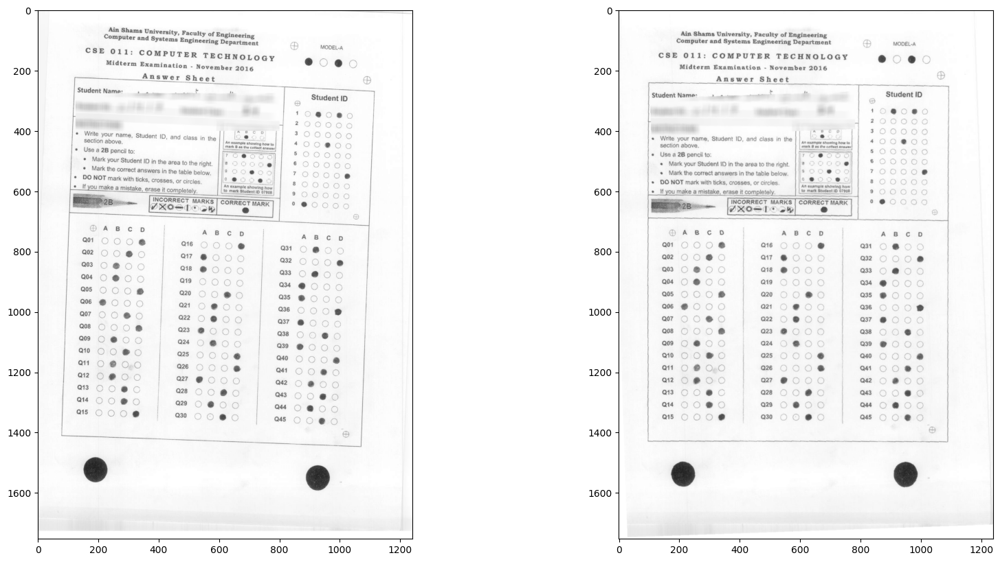

In [64]:
output = imrotate(image,2,False)

plt.figure(figsize=(20,10))
plt.subplot(121)
plt.imshow(image)
plt.subplot(122)
plt.imshow(output)

# Q.5 More Morphology

## 1

In [65]:
image = cv2.imread("../imgs/shapes.png")
image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)

image_g = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
k1 = [0,0]
k2 = [0,1]
a = [0,161]
b = [162,255]
image_g = piecewiseLinTransform(k1,k2,a,b,image_g)
out_c = ccl(image_g)
out_ind = out_c.copy()
uni = np.unique(out_c)
no_elem  = len(uni)
ratios = []
for i in range(1,len(uni)):
    where = np.where(out_c == uni[i])
    a = max(where[0]) - min(where[0])
    b = max(where[1]) - min(where[1])
    out_area = a*b
    ratio = len(where[0])/out_area
    ratios.append(ratio)
    out_ind[where] = i

### Objects with one or more holes




Total number objects with one or more holes are 6


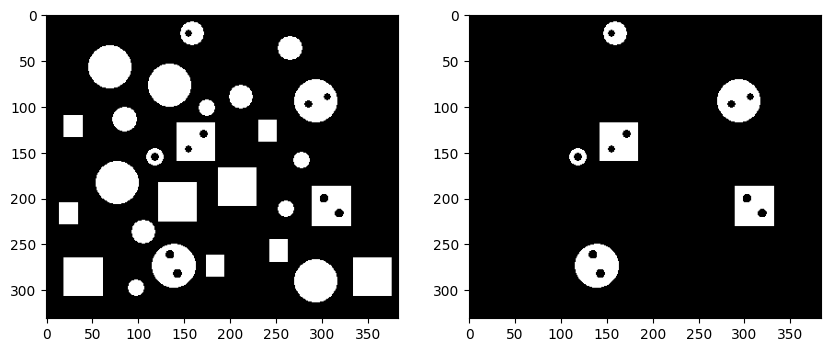

In [66]:
output = np.zeros(np.shape(out_ind))
x = 0
for i in range(no_elem-1):
    if(ratios[i] < 0.8 or 0.88 < ratios[i] < 1):
        where = np.where(out_ind == i+1)
        output[where] = 1
        x = x+1
print("Total number objects with one or more holes are",x)
plt.figure(figsize=(10,5))
plt.subplot(121)
plt.imshow(image)
plt.subplot(122)
plt.imshow(output,cmap='gray')
plt.show()



### Circular objects in the image.

Total circular objects in the image are 16


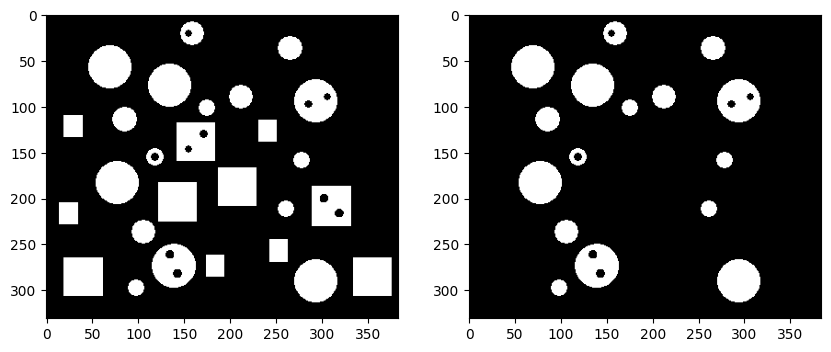

In [67]:
output = np.zeros(np.shape(out_ind))
x = 0
for i in range(no_elem-1):
    if(ratios[i] < 0.88):
        where = np.where(out_ind == i+1)
        output[where] = 1
        x = x+1
print("Total circular objects in the image are",x)
plt.figure(figsize=(10,5))
plt.subplot(121)
plt.imshow(image)
plt.subplot(122)
plt.imshow(output,cmap='gray')
plt.show()


### Number of rectangular objects not containing any holes

Number of rectangular objects not containing any holes 9


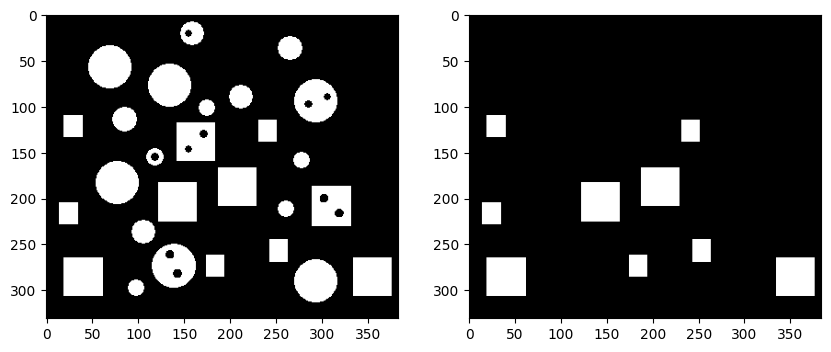

In [68]:
output = np.zeros(np.shape(out_ind))
x = 0
for i in range(no_elem-1):
    if(ratios[i] >= 0.99):
        where = np.where(out_ind == i+1)
        output[where] = 1
        x = x+1

print("Number of rectangular objects not containing any holes",x)
plt.figure(figsize=(10,5))
plt.subplot(121)
plt.imshow(image)
plt.subplot(122)
plt.imshow(output,cmap='gray')
plt.show()


### Number of circular objects containing one or more hole(s).

Number of circular objects containing one or more holes 4


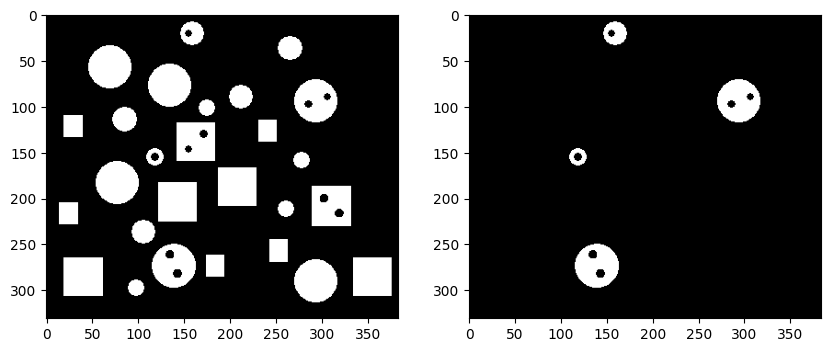

In [70]:
output = np.zeros(np.shape(out_ind))
x = 0
for i in range(no_elem-1):
    if(ratios[i] < 0.8):
        where = np.where(out_ind == i+1)
        output[where] = 1
        x = x+1
print("Number of circular objects containing one or more holes",x)
plt.figure(figsize=(10,5))
plt.subplot(121)
plt.imshow(image)
plt.subplot(122)
plt.imshow(output,cmap='gray')
plt.show()

## 2

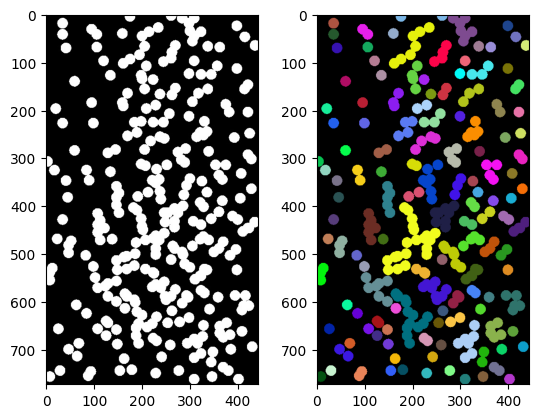

In [71]:
image = cv2.imread("../imgs/circles.jpg")
image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)

image_g = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
k1 = [0,0]
k2 = [0,255]
a = [0,40]
b = [40,255]
image_g = piecewiseLinTransform(k1,k2,a,b,image_g)
out_c = ccl(image_g)
image_ccl = color_map(out_c)
out_ind = out_c.copy()
uni = np.unique(out_c)
no_elem  = len(uni)
areas = []
for i in range(1,len(uni)):
    where = np.where(out_c == uni[i])
    area = len(where[0])
    areas.append(area)
    out_ind[where] = i

plt.subplot(121)
plt.imshow(image)
plt.subplot(122)
plt.imshow(image_ccl)
plt.show()

### Only non-overlapping circles

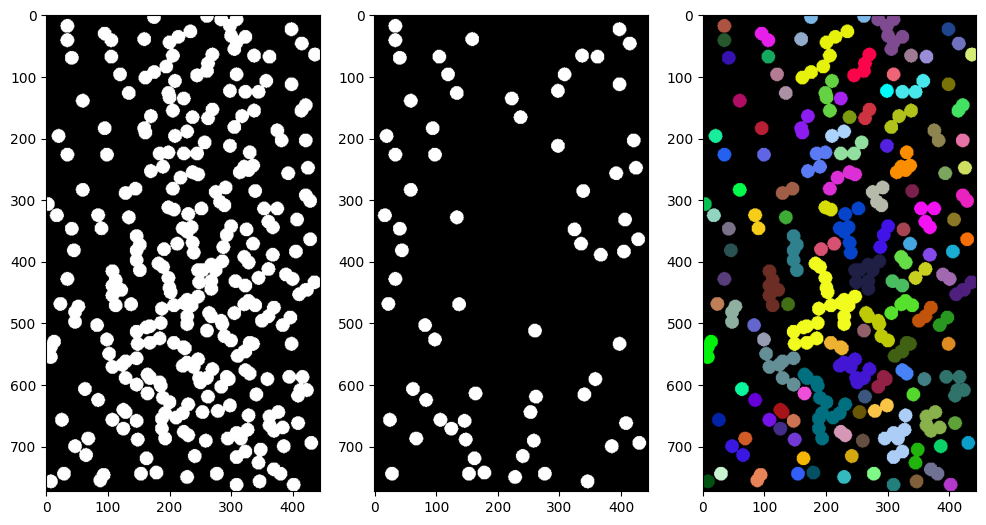

In [72]:
size = np.shape(out_c)
output = np.zeros(size)
for i in range(no_elem -1):
    if(areas[i] < 450):
        where = np.where(out_ind == i+1)
        if((0 in where[0]) or (0 in where[1]) or (size[0]-1 in where[0]) or (size[1]-1 in where[1])): pass
        else : output[where] = 255

plt.figure(figsize=(12,12))
plt.subplot(131)
plt.imshow(image)
plt.subplot(132)
plt.imshow(output,cmap='gray')
plt.subplot(133)
plt.imshow(image_ccl)
plt.show()

### Only circles which are touching the boundary

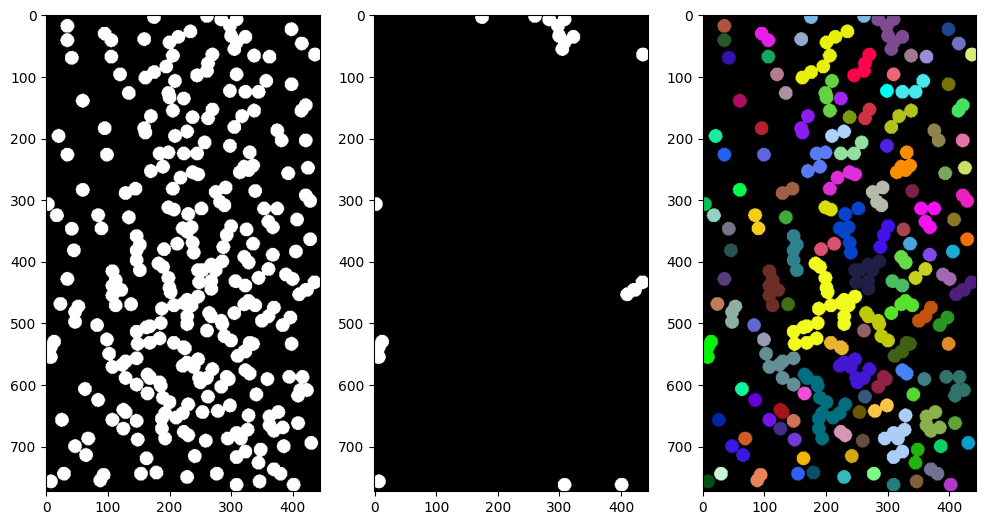

In [73]:
size = np.shape(out_c)
output = np.zeros(size)
for i in range(no_elem -1):
    where = np.where(out_ind == i+1)
    if((0 in where[0]) or (0 in where[1]) or (size[0]-1 in where[0]) or (size[1]-1 in where[1])):
        output[where] = 255

plt.figure(figsize=(12,12))
plt.subplot(131)
plt.imshow(image)
plt.subplot(132)
plt.imshow(output,cmap='gray')
plt.subplot(133)
plt.imshow(image_ccl)
plt.show()

### Only overlapping circles

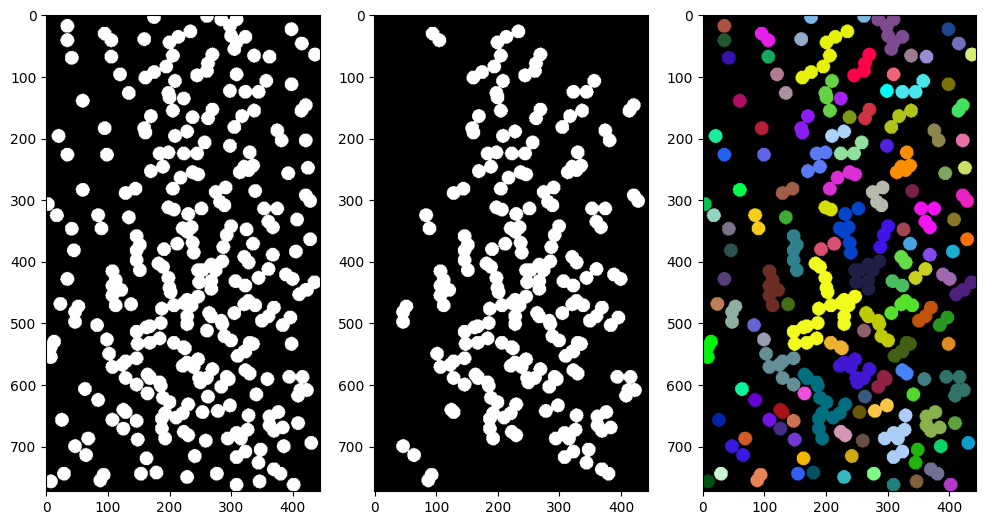

In [74]:
size = np.shape(out_c)
output = np.zeros(size)
for i in range(no_elem -1):
    if(areas[i] > 450):
        where = np.where(out_ind == i+1)
        if((0 in where[0]) or (0 in where[1]) or (size[0]-1 in where[0]) or (size[1]-1 in where[1])): pass
        else : output[where] = 255

plt.figure(figsize=(12,12))
plt.subplot(131)
plt.imshow(image)
plt.subplot(132)
plt.imshow(output,cmap='gray')
plt.subplot(133)
plt.imshow(image_ccl)
plt.show()

# 1.1.2

In [176]:
struc = np.array([[255,255,255,255,255],
                 [255,255,255,255,255],
                 [255,255,255,255,255],
                 [255,255,255,255,255],
                 [255,255,255,255,255]],dtype=np.uint8)

image = cv2.imread("../imgs/sampleStudentOMRSheet.png",0)

k1 = [0,0]
k2 = [0,255]
a = [0,200]
b = [201,255]
image_g = piecewiseLinTransform(k1,k2,a,b,image)
image_g = imrotate_g(image_g,-0.1,False)
out1 = dilation(image_g,struc)
image_g = erosion(out1,struc)
# answerkey_thres = erosion(out,struc)


start_v = 789
h_cord = [224,559,896]
sq_s = 27
gap = 15
gap_x = 15.4
answers = [-1]*45
l = 0
for i in range(3):
    g = start_v
    x = start_v
    y = h_cord[i]
    for j in range(15):
        a = y 
        b = a + sq_s + gap
        c = b + sq_s + gap
        d = c + sq_s + gap
        g = (g + gap_x + sq_s)
        if(hit_miss(anskey_thres[x:x+sq_s,a:a+sq_s],mark)): answers[l] = 'A'
        if(hit_miss(anskey_thres[x:x+sq_s,b:b+sq_s],mark)): answers[l] = 'B'
        if(hit_miss(anskey_thres[x:x+sq_s,c:c+sq_s],mark)): answers[l] = 'C'
        if(hit_miss(anskey_thres[x:x+sq_s,d:d+sq_s],mark)): answers[l] = 'D'
        x = int(g)
        l = l+1

print(answers)

[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1]
